In [1]:
from google.colab import files
files.upload()


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"arjunlakhanpxl","key":"2da63f450cceb778262d716d22c93b1e"}'}

In [2]:
!pip install kaggle


In [3]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [4]:
!kaggle datasets download -d fedesoriano/multijet-primary-dataset --unzip


Dataset URL: https://www.kaggle.com/datasets/fedesoriano/multijet-primary-dataset
License(s): CC0-1.0
  0% 0.00/1.09M [00:00<?, ?B/s]
100% 1.09M/1.09M [00:00<00:00, 610MB/s]


In [5]:
import os

for file in os.listdir():
    print(file)


.config
kaggle.json
MultiJetRun2010B.csv
sample_data


In [13]:
!pip install pandas


In [17]:
from google.colab import files
uploaded = files.upload()


Saving dielectron.csv to dielectron.csv


In [18]:
import pandas as pd

# Replace 'your_file.csv' with the actual filename you uploaded
df = pd.read_csv('dielectron.csv')
print(df.head())


      Run      Event        E1      px1         py1       pz1       pt1  \
0  147115  366639895  58.71410  -7.31132  10.531000 -57.29740  12.82020   
1  147115  366704169   6.61188  -4.15213  -0.579855  -5.11278   4.19242   
2  147115  367112316  25.54190 -11.48090   2.041680  22.72460  11.66100   
3  147115  366952149  65.39590   7.51214  11.887100  63.86620  14.06190   
4  147115  366523212  61.45040   2.95284 -14.622700 -59.61210  14.91790   

      eta1     phi1  Q1       E2        px2      py2      pz2       pt2  \
0 -2.20267  2.17766   1  11.2836  -1.032340 -1.88066 -11.0778   2.14537   
1 -1.02842 -3.00284  -1  17.1492 -11.713500  5.04474  11.4647  12.75360   
2  1.42048  2.96560   1  15.8203  -1.472800  2.25895 -15.5888   2.69667   
3  2.21838  1.00721   1  25.1273   4.087860  2.59641  24.6563   4.84272   
4 -2.09375 -1.37154  -1  13.8871  -0.277757 -2.42560 -13.6708   2.44145   

       eta2      phi2  Q2         M  
0 -2.344030 -2.072810  -1   8.94841  
1  0.808077  2.734920 

Invariant Mass Distribution (M)


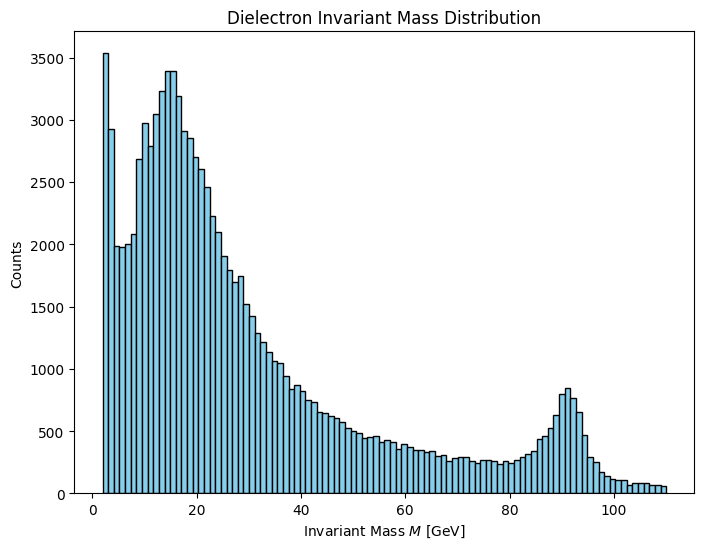

In [23]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
plt.hist(df['M'], bins=100, color='skyblue', edgecolor='k')
plt.xlabel('Invariant Mass $M$ [GeV]')
plt.ylabel('Counts')
plt.title('Dielectron Invariant Mass Distribution')
plt.show()


Transverse Momentum Distributions

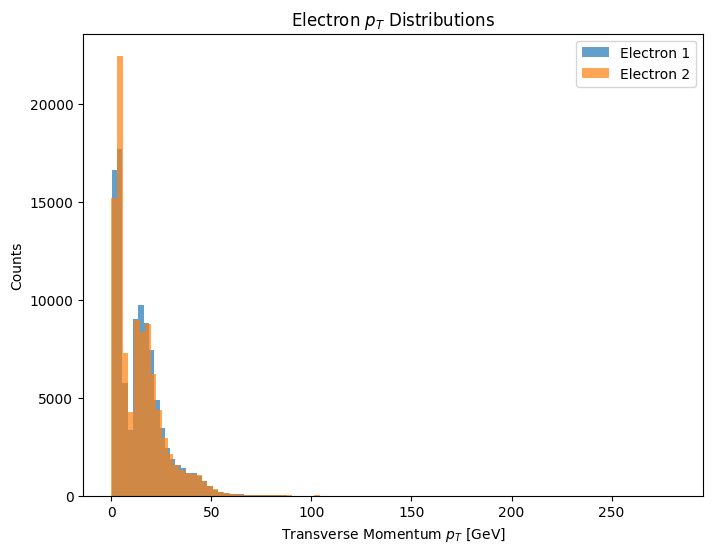

In [24]:
plt.figure(figsize=(8,6))
plt.hist(df['pt1'], bins=100, alpha=0.7, label='Electron 1')
plt.hist(df['pt2'], bins=100, alpha=0.7, label='Electron 2')
plt.xlabel('Transverse Momentum $p_T$ [GeV]')
plt.ylabel('Counts')
plt.title('Electron $p_T$ Distributions')
plt.legend()
plt.show()


Calculate Total Transverse Momentum


In [25]:
df['pt_sum'] = df['pt1'] + df['pt2']


Calculate Delta Phi and Delta Eta


In [26]:
import numpy as np

df['delta_phi'] = np.abs(df['phi1'] - df['phi2'])
df['delta_eta'] = np.abs(df['eta1'] - df['eta2'])


Select Events in Z Mass Window (for example, 80 < M < 100 GeV)


In [27]:
z_window = df[(df['M'] > 80) & (df['M'] < 100)]
print(z_window.head())


       Run      Event       E1      px1        py1        pz1       pt1  \
20  147115  369036793  28.2165  22.39330  -4.73948  16.499800  22.88940   
26  147115  368934550  39.6056 -31.37060 -24.16940   0.568363  39.60150   
33  147115  369449951  33.4986   9.75679  14.44640 -28.605300  17.43260   
49  147115  481522582  33.5242  20.34240   3.35346  26.435100  20.61690   
59  147115  483006488  26.2592  -3.59710  -6.11430 -25.282800   7.09393   

        eta1      phi1  Q1  ...       py2      pz2      pt2      eta2  \
20  0.669664 -0.208569   1  ...   9.98944 -94.9368  20.6032 -2.232480   
26  0.014352 -2.485130   1  ...  -7.87303 -49.2985  49.9211 -0.872527   
33 -1.270470  0.976787  -1  ... -18.81680  52.0177  22.6830  1.567580   
49  1.067550  0.163381   1  ...  -8.28623 -54.6221  23.8899 -1.564840   
59 -1.983160 -2.102580   1  ...  10.05210  86.7180  14.4570  2.491500   

        phi2  Q2        M    pt_sum  delta_phi  delta_eta  
20  2.635400  -1  97.5545  43.49260   2.843969   2

 Simple Machine Learning Example: Classify High vs. Low Mass Events


In [28]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

# Example: classify if M > 50 GeV
df['high_mass'] = (df['M'] > 50).astype(int)
features = ['pt1', 'pt2', 'eta1', 'eta2', 'phi1', 'phi2', 'Q1', 'Q2']
X = df[features]
y = df['high_mass']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
clf = RandomForestClassifier()
clf.fit(X_train, y_train)
print("Accuracy:", clf.score(X_test, y_test))


Accuracy: 0.9746449289857971


Summary Statistics

In [29]:
print('Max invariant mass:', df['M'].max())
print('Min invariant mass:', df['M'].min())
print('Mean invariant mass:', df['M'].mean())
print('Median invariant mass:', df['M'].median())


Max invariant mass: 109.999
Min invariant mass: 2.00008
Mean invariant mass: 30.020881689624794
Median invariant mass: 21.2841


In [30]:
print("Train Accuracy:", clf.score(X_train, y_train))
print("Test Accuracy:", clf.score(X_test, y_test))


Train Accuracy: 1.0
Test Accuracy: 0.9746449289857971


Confusion Matrix

In [31]:
from sklearn.metrics import confusion_matrix, classification_report

y_pred = clf.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[16315   137]
 [  370  3174]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98     16452
           1       0.96      0.90      0.93      3544

    accuracy                           0.97     19996
   macro avg       0.97      0.94      0.96     19996
weighted avg       0.97      0.97      0.97     19996



Feature Importance

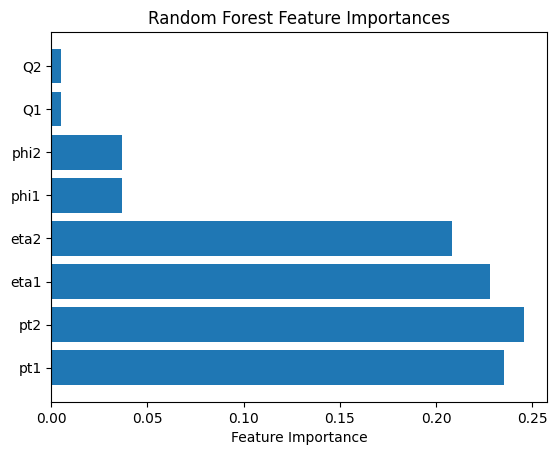

In [32]:
import matplotlib.pyplot as plt

importances = clf.feature_importances_
feature_names = X.columns
plt.barh(feature_names, importances)
plt.xlabel("Feature Importance")
plt.title("Random Forest Feature Importances")
plt.show()


In [34]:
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

In [35]:
# 1. Check for Overfitting
train_acc = clf.score(X_train, y_train)
test_acc = clf.score(X_test, y_test)
print(f"Train Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

Train Accuracy: 1.0000
Test Accuracy: 0.9746


In [36]:
# 2. Confusion Matrix and Classification Report
y_pred = clf.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print("\nConfusion Matrix:\n", cm)
print("\nClassification Report:\n", classification_report(y_test, y_pred))



Confusion Matrix:
 [[16315   137]
 [  370  3174]]

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.98     16452
           1       0.96      0.90      0.93      3544

    accuracy                           0.97     19996
   macro avg       0.97      0.94      0.96     19996
weighted avg       0.97      0.97      0.97     19996



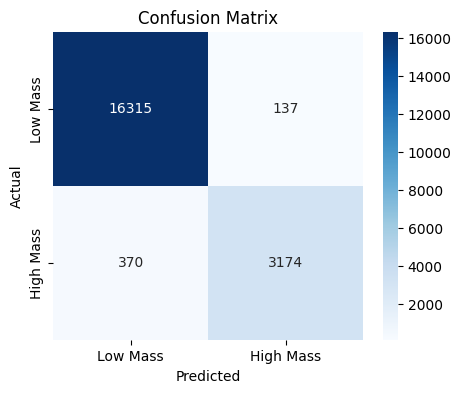

In [37]:
# Plot Confusion Matrix
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Low Mass', 'High Mass'], yticklabels=['Low Mass', 'High Mass'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

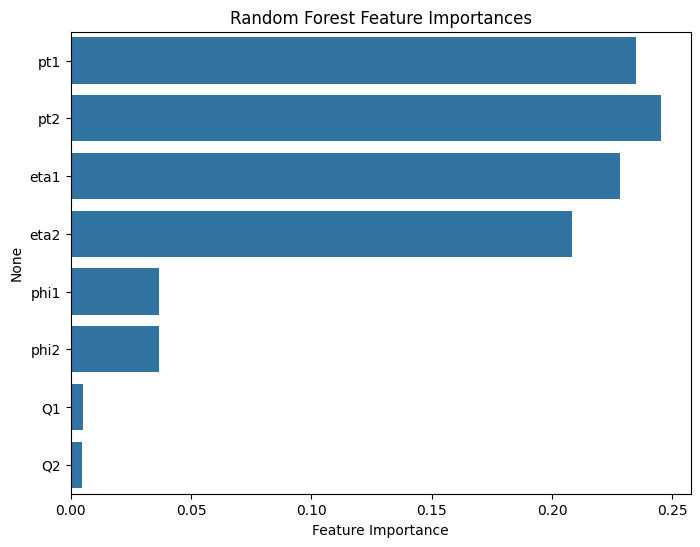

In [38]:
# 3. Feature Importance Plot
importances = clf.feature_importances_
feature_names = X.columns
plt.figure(figsize=(8,6))
sns.barplot(x=importances, y=feature_names)
plt.xlabel("Feature Importance")
plt.title("Random Forest Feature Importances")
plt.show()

In [39]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier

models = {
    'Random Forest': RandomForestClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'XGBoost': XGBClassifier(eval_metric='logloss')
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for name, model in models.items():
    scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
    print(f"{name}: Mean Accuracy = {scores.mean():.3f} ± {scores.std():.3f}")


Random Forest: Mean Accuracy = 0.975 ± 0.001
AdaBoost: Mean Accuracy = 0.855 ± 0.001
XGBoost: Mean Accuracy = 0.988 ± 0.001


In [41]:
from google.colab import files
files.upload()


Saving dielectron.csv to dielectron (1).csv


{'dielectron (1).csv': b'Run,Event,E1,px1 ,py1,pz1,pt1,eta1,phi1,Q1,E2,px2,py2,pz2,pt2,eta2,phi2,Q2,M\n147115,366639895,58.7141,-7.31132,10.531,-57.2974,12.8202,-2.20267,2.17766,1,11.2836,-1.03234,-1.88066,-11.0778,2.14537,-2.34403,-2.07281,-1,8.94841\n147115,366704169,6.61188,-4.15213,-0.579855,-5.11278,4.19242,-1.02842,-3.00284,-1,17.1492,-11.7135,5.04474,11.4647,12.7536,0.808077,2.73492,1,15.893\n147115,367112316,25.5419,-11.4809,2.04168,22.7246,11.661,1.42048,2.9656,1,15.8203,-1.4728,2.25895,-15.5888,2.69667,-2.45508,2.14857,1,38.3877\n147115,366952149,65.3959,7.51214,11.8871,63.8662,14.0619,2.21838,1.00721,1,25.1273,4.08786,2.59641,24.6563,4.84272,2.33021,0.565865,-1,3.72862\n147115,366523212,61.4504,2.95284,-14.6227,-59.6121,14.9179,-2.09375,-1.37154,-1,13.8871,-0.277757,-2.4256,-13.6708,2.44145,-2.4237,-1.68481,-1,2.74718\n147115,366663412,6.39616,-5.45672,-2.09068,-2.60078,5.84352,-0.431551,-2.77571,-1,21.3865,15.1698,-8.8703,-12.1893,17.5728,-0.64745,-0.52912,-1,18.4023\n14711

In [43]:
import os
print(os.listdir())


['.config', 'kaggle.json', 'dielectron (1).csv', 'MultiJetRun2010B.csv', 'dielectron.csv', 'sample_data']


In [44]:
df = pd.read_csv('dielectron.csv')


montecarlo code

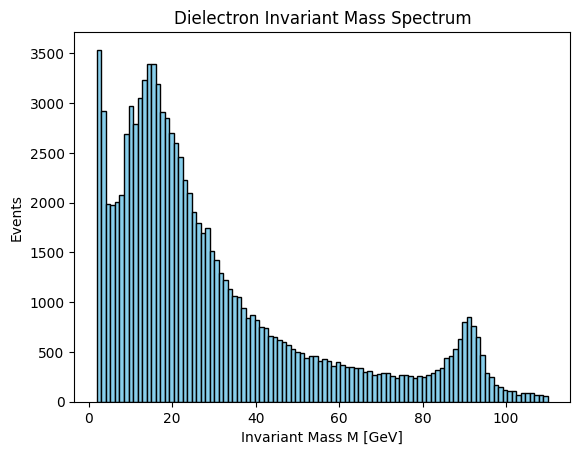

In [45]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
df = pd.read_csv('dielectron.csv')  # or your Kaggle/CERN file

# Plot the invariant mass distribution
plt.hist(df['M'], bins=100, color='skyblue', edgecolor='k')
plt.xlabel('Invariant Mass M [GeV]')
plt.ylabel('Events')
plt.title('Dielectron Invariant Mass Spectrum')
plt.show()


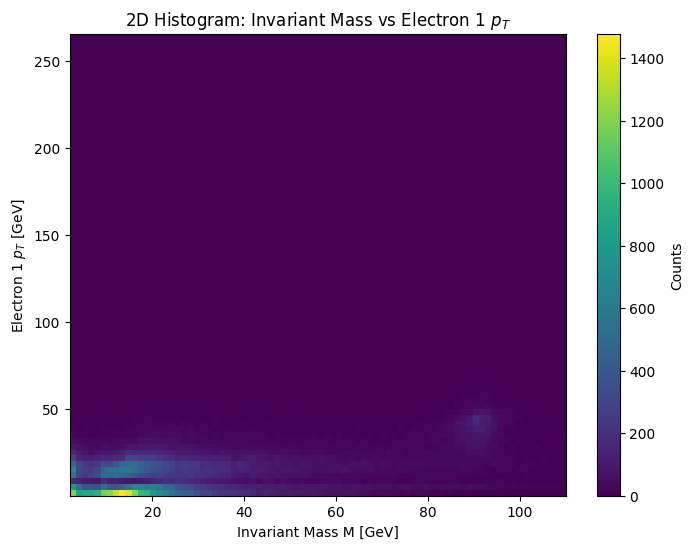

In [49]:
import numpy as np
import matplotlib.pyplot as plt

# Drop rows where 'M' or 'pt1' is NaN
filtered = df.dropna(subset=['M', 'pt1'])

plt.figure(figsize=(8,6))
plt.hist2d(filtered['M'], filtered['pt1'], bins=(80, 80), cmap='viridis')
plt.xlabel('Invariant Mass M [GeV]')
plt.ylabel('Electron 1 $p_T$ [GeV]')
plt.title('2D Histogram: Invariant Mass vs Electron 1 $p_T$')
plt.colorbar(label='Counts')
plt.show()


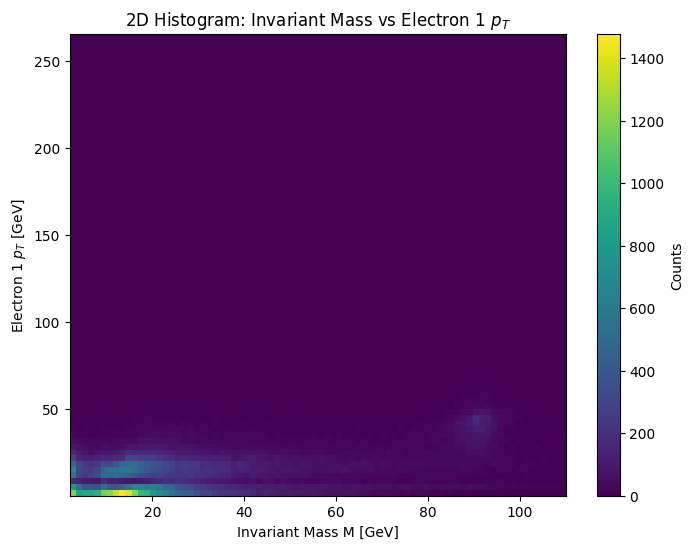

In [50]:
mask = (~np.isnan(df['M'])) & (~np.isnan(df['pt1']))
plt.figure(figsize=(8,6))
plt.hist2d(df['M'][mask], df['pt1'][mask], bins=(80, 80), cmap='viridis')
plt.xlabel('Invariant Mass M [GeV]')
plt.ylabel('Electron 1 $p_T$ [GeV]')
plt.title('2D Histogram: Invariant Mass vs Electron 1 $p_T$')
plt.colorbar(label='Counts')
plt.show()


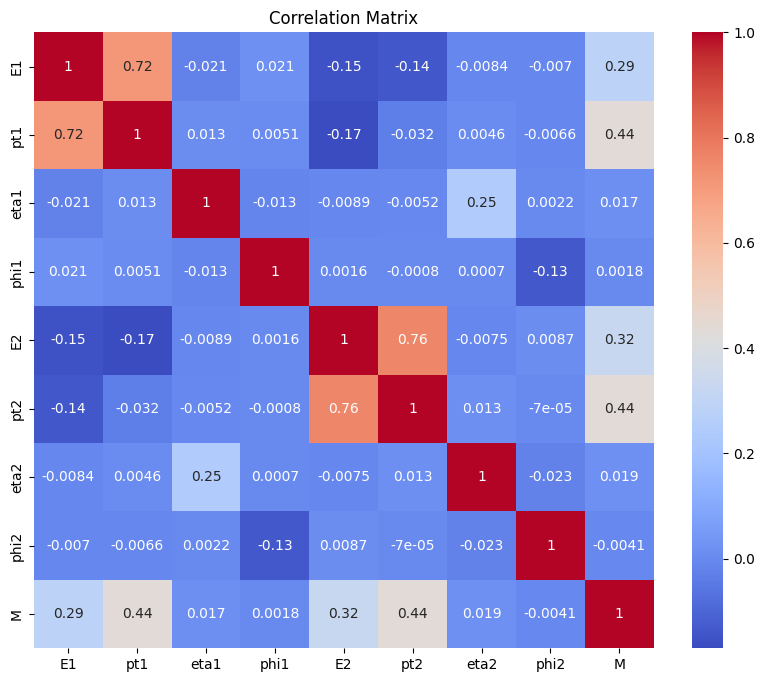

In [51]:
import seaborn as sns

plt.figure(figsize=(10,8))
sns.heatmap(df[['E1','pt1','eta1','phi1','E2','pt2','eta2','phi2','M']].corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


In [52]:
import plotly.express as px

fig = px.scatter(df, x='pt1', y='pt2', color='M', title='Electron $p_T$ Correlation Colored by Invariant Mass')
fig.show()


In [53]:
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, roc_auc_score

df['signal'] = (df['M'] > 80).astype(int)
features = ['pt1', 'pt2', 'eta1', 'eta2', 'phi1', 'phi2', 'Q1', 'Q2']
X, y = df[features], df['signal']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

xgb = XGBClassifier(eval_metric='logloss')
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)
y_prob = xgb.predict_proba(X_test)[:,1]

print(classification_report(y_test, y_pred))
print("ROC AUC:", roc_auc_score(y_test, y_prob))


              precision    recall  f1-score   support

           0       1.00      0.99      1.00     18281
           1       0.95      0.95      0.95      1719

    accuracy                           0.99     20000
   macro avg       0.97      0.97      0.97     20000
weighted avg       0.99      0.99      0.99     20000

ROC AUC: 0.9987185059658956


In [54]:
from sklearn.ensemble import IsolationForest

iso = IsolationForest(contamination=0.01)
df['anomaly_score'] = iso.fit_predict(X)
anomalies = df[df['anomaly_score'] == -1]
print("Number of anomalies detected:", len(anomalies))


Number of anomalies detected: 1000
